# Telecom Churn Case Study

# Problem Statement:

## Business Problem Overview

In the telecom industry, customers can choose from numerous providers and often switch between them due to fierce competition, resulting in a 15-25% annual churn rate. Given the high cost of acquiring new customers, retaining existing ones has become a top priority. Established operators focus on retaining profitable customers. To address churn, telecom companies need to predict potential defectors. This project involves analyzing customer-level data from a leading telecom firm to create predictive models that identify high-churn-risk customers and key indicators of churn.

## Understanding and Defining Churn

The telecom industry employs two primary payment models: **postpaid** (where customers settle bills after service usage) and **prepaid** (where customers prepay and then consume services).

In the postpaid setup, customer churn is straightforward as they notify the operator when switching. In prepaid, churn determination is complex. Customers may halt usage without notice, making it hard to distinguish between genuine churn and temporary non-usage (e.g., travel). Predicting churn is especially critical for prepaid users, necessitating precise churn definition. Prepaid predominates in India and Southeast Asia, while postpaid is more common in Europe and North America.

This project focuses on the Indian and Southeast Asian market, recognizing the distinctive challenges posed by prepaid churn prediction.

## Definition of Churn

Churn can be defined in different ways:

1. **Revenue-based churn:** Identifying customers who haven't used revenue-generating services, like calls or data, over a specific period. This may not capture customers who only receive calls/SMS but don't generate revenue.


2. **Usage-based churn:** Recognizing customers who've had no activity, incoming or outgoing, over a period. The drawback is that it might be too late to act when this is detected, as the customer may have already switched.

This project employs the **usage-based definition** to define churn, focusing on activity levels as the key indicator.

## High-value Churn

In the Indian and Southeast Asian market, 80% of revenue is generated by the top 20% of customers, known as high-value customers. By minimizing churn among these high-value customers, we can prevent substantial revenue loss. This project focuses on identifying high-value customers based on specific metrics and predicting churn exclusively within this segment.

## Understanding The Business Objective and The Data

The dataset covers four months: June (6), July (7), August (8), and September (9). The goal is to forecast churn in the ninth month using data from the initial three months. Understanding typical customer behavior during churn is vital for this task.

## Understanding Customer Behaviour During Churn

Churn prediction involves **three customer lifecycle phases:**

- **Good Phase:** Customers are content and exhibit regular behavior.

- **Action Phase:** Customer experience deteriorates due to various factors like competitor offers, billing issues, or service quality problems. Identifying high-churn-risk customers during this phase is crucial for intervention.

- **Churn Phase:** Customers are considered churned. Churn is defined based on this phase. Notably, this phase's data isn't available during prediction. Data from this phase is discarded after **tagging churn as 1/0.**

**In a four-month window, the first two months represent the 'good' phase, the third month is the 'action' phase, and the fourth month is the 'churn' phase.**

# Importing Required Libraries

In [33]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import time

In [34]:
import seaborn as sns
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import FeatureUnion

In [35]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score

## Reading Dataset and Understanding Data

In [38]:
df = pd.read_csv("telecom_churn_data.csv")

### Verifying the head of the dataframe

In [39]:
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [40]:
#Checking the shape:
df.shape

(99999, 226)

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [42]:
#Checking the numerical data:
df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [43]:
#Checking the columns:
print(list(df.columns ), end='')

['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'offnet_mou_9', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_ic_mou_9', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'roam_og_mou_9', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2t_mou_9', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou

In [44]:
#Checking the size of data:
df.size

22599774

In [45]:
#Creating column name list by types of columns:
id_columns = ['mobile_number', 'circle_id']
date_columns = ['last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','last_date_of_month_9','date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9','date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9']
cat_columns =  ['night_pck_user_6','night_pck_user_7','night_pck_user_8','night_pck_user_9','fb_user_6','fb_user_7','fb_user_8','fb_user_9']
num_columns = [column for column in df.columns if column not in id_columns + date_columns + cat_columns]

In [46]:
#Checkingif any columnns are missed:
print(len(id_columns) + len(date_columns) + len(num_columns) + len(cat_columns) == df.shape[1])

True


In [47]:
#Checking for missing values:
(df.isnull().sum()*100/df.shape[0]).sort_values(ascending=False)

arpu_3g_6                   74.846748
night_pck_user_6            74.846748
total_rech_data_6           74.846748
arpu_2g_6                   74.846748
max_rech_data_6             74.846748
fb_user_6                   74.846748
av_rech_amt_data_6          74.846748
date_of_last_rech_data_6    74.846748
count_rech_2g_6             74.846748
count_rech_3g_6             74.846748
date_of_last_rech_data_7    74.428744
total_rech_data_7           74.428744
fb_user_7                   74.428744
max_rech_data_7             74.428744
night_pck_user_7            74.428744
count_rech_2g_7             74.428744
av_rech_amt_data_7          74.428744
arpu_2g_7                   74.428744
count_rech_3g_7             74.428744
arpu_3g_7                   74.428744
total_rech_data_9           74.077741
count_rech_3g_9             74.077741
fb_user_9                   74.077741
max_rech_data_9             74.077741
arpu_3g_9                   74.077741
date_of_last_rech_data_9    74.077741
night_pck_us

**Approximately 74-75% of null values exist for average recharge amount, max recharge data, total recharge date, and mobile internet data recharge date.**

In [48]:
#The minimum value for the 'recharge' column is 1:
recharge_columns = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9',
                 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9',
                 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9',
                 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9',
                 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9',
                 ]

df[recharge_columns].describe(include='all')

,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9
count,25153.000000,25571.000000,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.00000,25153.000000,25571.000000,26339.000000,25922.000000
mean,2.463802,2.666419,2.651999,2.441170,1.864668,2.044699,2.016288,1.781807,0.599133,0.621720,0.635711,0.659363,126.393392,126.729459,125.717301,124.94144,192.600982,200.981292,197.526489,192.734315
std,2.789128,3.031593,3.074987,2.516339,2.570254,2.768332,2.720132,2.214701,1.274428,1.394524,1.422827,1.411513,108.477235,109.765267,109.437851,111.36376,192.646318,196.791224,191.301305,188.400286
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.00000,1.000000,0.500000,0.500000,1.000000
25%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,25.000000,25.000000,25.000000,25.00000,82.000000,92.000000,87.000000,69.000000
50%,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,145.000000,145.000000,145.000000,145.00000,154.000000,154.000000,154.000000,164.000000
75%,3.000000,3.000000,3.000000,3.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,177.000000,177.000000,179.000000,179.00000,252.000000,252.000000,252.000000,252.000000
max,61.000000,54.000000,60.000000,84.000000,42.000000,48.000000,44.000000,40.000000,29.000000,35.000000,45.000000,49.000000,1555.000000,1555.000000,1555.000000,1555.00000,7546.000000,4365.000000,4076.000000,4061.000000


We can identify three key metrics for the 'data' category:

- Total recharge amount

- Maximum recharge amount

- Average recharge amount

Additionally, we have total and maximum recharge values specifically for the **'data'** category.

In [51]:
#The customer didn't recharge due to missing recharge date and value:
df.loc[df.total_rech_data_7.isnull() & df.date_of_last_rech_data_7.isnull(),\
       ["total_rech_data_7", "date_of_last_rech_data_7"]].head(10)

,total_rech_data_7,date_of_last_rech_data_7
2,NaN,NaN
3,NaN,NaN
4,NaN,NaN
5,NaN,NaN
6,NaN,NaN
7,NaN,NaN
10,NaN,NaN
11,NaN,NaN
12,NaN,NaN
13,NaN,NaN


In [52]:
#Let's verify whether there are any instances where 'total_rech_data' is 'NA' while a value is present for 'av_rech_amt_data,' and vice versa:
#Check how many instances of 'av_rech_amt_data_6' are missing (NA):
is_invalid_data_6 = df['av_rech_amt_data_6'] == np.nan
is_invalid_data_7 = df['av_rech_amt_data_7'] == np.nan
is_invalid_data_8 = df['av_rech_amt_data_7'] == np.nan

#Check the presence of any values in the 'total_rech_data' column for these rows:
print(df.loc[is_invalid_data_6,'total_rech_data_6'].sum())
print(df.loc[is_invalid_data_7,'total_rech_data_7'].sum())
print(df.loc[is_invalid_data_8,'total_rech_data_8'].sum())

#Check how many instances of 'total_rech_data_6' are missing (NA):
is_invalid_data_6 = df['total_rech_data_6'] == np.nan 
is_invalid_data_7 = df['total_rech_data_7'] == np.nan 
is_invalid_data_8 = df['total_rech_data_8'] == np.nan 

#Check the presence of any values in the 'av_rech_amt_data_6' column for these rows:
print(df.loc[is_invalid_data_6,'av_rech_amt_data_6'].sum())
print(df.loc[is_invalid_data_7,'av_rech_amt_data_7'].sum())
print(df.loc[is_invalid_data_8,'av_rech_amt_data_8'].sum())

0.0
0.0
0.0
0.0
0.0
0.0


From above, we observe that the values exhibit consistency among them. Furthermore, since the minimum value is 1, it is a viable approach to impute the missing values.

In [53]:
#Let's impute 0 in recharge columns:
impute_recharge_zero = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9',
        'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9',
        'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9'
       ]

In [54]:
#Replace the missing values with zeros:
df[impute_recharge_zero] = df[impute_recharge_zero].apply(lambda x: x.fillna(0))

In [55]:
print(df[impute_recharge_zero].isnull().sum()*100/df.shape[1])

total_rech_data_6     0.0
total_rech_data_7     0.0
total_rech_data_8     0.0
total_rech_data_9     0.0
av_rech_amt_data_6    0.0
av_rech_amt_data_7    0.0
av_rech_amt_data_8    0.0
av_rech_amt_data_9    0.0
max_rech_data_6       0.0
max_rech_data_7       0.0
max_rech_data_8       0.0
max_rech_data_9       0.0
dtype: float64


In [56]:
#Distinct values within every column:
df.nunique().sort_values(ascending=False)

mobile_number               99999
arpu_6                      85681
arpu_7                      85308
arpu_8                      83615
arpu_9                      79937
total_og_mou_7              40477
total_og_mou_6              40327
total_og_mou_8              40074
total_og_mou_9              39160
total_ic_mou_6              32247
total_ic_mou_7              32242
total_ic_mou_8              32128
total_ic_mou_9              31260
offnet_mou_6                31140
offnet_mou_7                31023
offnet_mou_8                30908
offnet_mou_9                30077
loc_ic_mou_6                28569
loc_ic_mou_7                28390
loc_ic_mou_8                28200
std_og_mou_7                27951
loc_ic_mou_9                27697
std_og_mou_6                27502
std_og_mou_8                27491
std_og_mou_9                26553
loc_og_mou_6                26372
loc_og_mou_7                26091
loc_og_mou_8                25990
loc_og_mou_9                25376
onnet_mou_7   

In [57]:
#Drop the columns:
df = df.drop(id_columns + date_columns, axis=1)
df.shape

(99999, 212)

In [58]:
#Replace missing values with '-1' in categorical columns:
df[cat_columns] = df[cat_columns].apply(lambda x: x.fillna(-1))

In [59]:
#Verify the data:
print("Missing value ratio:\n")
print(df[cat_columns].isnull().sum()*100/df.shape[0])

Missing value ratio:

night_pck_user_6    0.0
night_pck_user_7    0.0
night_pck_user_8    0.0
night_pck_user_9    0.0
fb_user_6           0.0
fb_user_7           0.0
fb_user_8           0.0
fb_user_9           0.0
dtype: float64


In [61]:
#Drop variables that exceed a specified threshold of missing values:

initial_columns = df.shape[1]

MISSING_THRESHOLD = 0.7

include_columns = list(df.apply(lambda column: True if column.isnull().sum()/df.shape[0] < MISSING_THRESHOLD else False))

drop_the_missing = pd.DataFrame({'features':df.columns , 'include': include_columns})
drop_the_missing.loc[drop_the_missing.include == True,:]

,features,include
0,loc_og_t2o_mou,True
1,std_og_t2o_mou,True
2,loc_ic_t2o_mou,True
3,arpu_6,True
4,arpu_7,True
5,arpu_8,True
6,arpu_9,True
7,onnet_mou_6,True
8,onnet_mou_7,True
9,onnet_mou_8,True


In [62]:
#Dropping the columns:
df = df.loc[:, include_columns]

dropped_columns = df.shape[1] - initial_columns
print("{0} columns dropped.".format(dropped_columns))

-16 columns dropped.


In [64]:
#Fill the missing values in the respective columns with zeros: 
df[df.select_dtypes(exclude=['datetime64[ns]','category']).columns.tolist()] = df[df.select_dtypes(exclude=['datetime64[ns]','category']).columns.tolist()].fillna(0, axis=1)

In [65]:
#Filtering the high-value customers:
#Observe the recharge columns:
recharge_df = df.columns[df.columns.str.contains('rech_amt|rech_data')]
recharge_df 

Index(['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'total_rech_amt_9', 'max_rech_amt_6', 'max_rech_amt_7',
       'max_rech_amt_8', 'max_rech_amt_9', 'total_rech_data_6',
       'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9',
       'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8',
       'max_rech_data_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7',
       'av_rech_amt_data_8', 'av_rech_amt_data_9'],
      dtype='object')

In [66]:
#Null values in the recharge columns:
100*df.loc[:,recharge_df].isnull().sum()/len(df)

total_rech_amt_6      0.0
total_rech_amt_7      0.0
total_rech_amt_8      0.0
total_rech_amt_9      0.0
max_rech_amt_6        0.0
max_rech_amt_7        0.0
max_rech_amt_8        0.0
max_rech_amt_9        0.0
total_rech_data_6     0.0
total_rech_data_7     0.0
total_rech_data_8     0.0
total_rech_data_9     0.0
max_rech_data_6       0.0
max_rech_data_7       0.0
max_rech_data_8       0.0
max_rech_data_9       0.0
av_rech_amt_data_6    0.0
av_rech_amt_data_7    0.0
av_rech_amt_data_8    0.0
av_rech_amt_data_9    0.0
dtype: float64

In [67]:
df.loc[:,recharge_df].describe()

,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9
count,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,327.514615,322.962970,324.157122,303.345673,104.637486,104.752398,107.728207,101.943889,0.619726,0.681837,0.698517,0.632806,31.792048,32.406314,33.113011,32.387644,48.445409,51.393440,52.027022,49.961089
std,398.019701,408.114237,416.540455,404.588583,120.614894,124.523970,126.902505,125.375109,1.760541,1.924382,1.963417,1.669040,77.248778,78.342435,78.872739,78.818696,127.743863,132.629365,131.182609,127.804280
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,109.000000,100.000000,90.000000,52.000000,30.000000,30.000000,30.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,230.000000,220.000000,225.000000,200.000000,110.000000,110.000000,98.000000,61.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,437.500000,428.000000,434.500000,415.000000,120.000000,128.000000,144.000000,144.000000,1.000000,1.000000,1.000000,1.000000,8.000000,14.000000,17.000000,17.000000,8.250000,17.000000,23.000000,17.000000
max,35190.000000,40335.000000,45320.000000,37235.000000,4010.000000,4010.000000,4449.000000,3399.000000,61.000000,54.000000,60.000000,84.000000,1555.000000,1555.000000,1555.000000,1555.000000,7546.000000,4365.000000,4076.000000,4061.000000


In [68]:
df.loc[:, recharge_df].head(10)

,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9
0,362.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0
1,74.0,384.0,283.0,121.0,44.0,154.0,65.0,50.0,0.0,1.0,2.0,0.0,0.0,154.0,25.0,0.0,0.0,154.0,50.0,0.0
2,168.0,315.0,116.0,358.0,86.0,200.0,86.0,100.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,46.0,0.0,0.0,0.0,46.0
3,230.0,310.0,601.0,410.0,60.0,50.0,50.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,196.0,350.0,287.0,200.0,56.0,110.0,110.0,50.0,1.0,0.0,0.0,0.0,56.0,0.0,0.0,0.0,56.0,0.0,0.0,0.0
5,120.0,0.0,130.0,130.0,120.0,0.0,130.0,130.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,499.0,222.0,294.0,141.0,90.0,37.0,50.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,1580.0,790.0,3638.0,0.0,1580.0,790.0,1580.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,437.0,601.0,120.0,186.0,90.0,154.0,30.0,36.0,0.0,2.0,3.0,0.0,0.0,154.0,23.0,0.0,0.0,177.0,69.0,0.0
9,220.0,195.0,210.0,180.0,110.0,154.0,50.0,130.0,0.0,1.0,0.0,0.0,0.0,154.0,0.0,0.0,0.0,154.0,0.0,0.0


In [69]:
#Examine data specifically for the month of June:
recharge_df_6 = df.columns[df.columns.str.contains('rech_amt_6|rech_data_6|rech_amt_data_6')]
df.loc[:,recharge_df_6].head(10)

,total_rech_amt_6,max_rech_amt_6,total_rech_data_6,max_rech_data_6,av_rech_amt_data_6
0,362.0,252.0,1.0,252.0,252.0
1,74.0,44.0,0.0,0.0,0.0
2,168.0,86.0,0.0,0.0,0.0
3,230.0,60.0,0.0,0.0,0.0
4,196.0,56.0,1.0,56.0,56.0
5,120.0,120.0,0.0,0.0,0.0
6,499.0,90.0,0.0,0.0,0.0
7,1580.0,1580.0,0.0,0.0,0.0
8,437.0,90.0,0.0,0.0,0.0
9,220.0,110.0,0.0,0.0,0.0


In [70]:
df.loc[:,recharge_df_6].describe()

,total_rech_amt_6,max_rech_amt_6,total_rech_data_6,max_rech_data_6,av_rech_amt_data_6
count,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,327.514615,104.637486,0.619726,31.792048,48.445409
std,398.019701,120.614894,1.760541,77.248778,127.743863
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,109.000000,30.000000,0.000000,0.000000,0.000000
50%,230.000000,110.000000,0.000000,0.000000,0.000000
75%,437.500000,120.000000,1.000000,8.000000,8.250000
max,35190.000000,4010.000000,61.000000,1555.000000,7546.000000


In [71]:
#Checking the proportion of missing values in columns related to recharges:
100*df.loc[:,recharge_df].isnull().sum()/len(df)

total_rech_amt_6      0.0
total_rech_amt_7      0.0
total_rech_amt_8      0.0
total_rech_amt_9      0.0
max_rech_amt_6        0.0
max_rech_amt_7        0.0
max_rech_amt_8        0.0
max_rech_amt_9        0.0
total_rech_data_6     0.0
total_rech_data_7     0.0
total_rech_data_8     0.0
total_rech_data_9     0.0
max_rech_data_6       0.0
max_rech_data_7       0.0
max_rech_data_8       0.0
max_rech_data_9       0.0
av_rech_amt_data_6    0.0
av_rech_amt_data_7    0.0
av_rech_amt_data_8    0.0
av_rech_amt_data_9    0.0
dtype: float64

In [72]:
#Obtaining the indices of null values for both columns and verify if they match: 
#If the result is False, it indicates that all rows in 'total_rech_data' and 'av_rech_amt_data' have null values in the same rows:
result = df.total_rech_data_6[df.total_rech_data_6.isna()].index != df.av_rech_amt_data_6[df.av_rech_amt_data_6.isna()].index
print('June :', result.any())
result = df.total_rech_data_7[df.total_rech_data_7.isna()].index != df.av_rech_amt_data_7[df.av_rech_amt_data_7.isna()].index
print('July :', result.any())
result =df.total_rech_data_8[df.total_rech_data_8.isna()].index != df.av_rech_amt_data_8[df.av_rech_amt_data_8.isna()].index
print('Aug :', result.any())

June : False
July : False
Aug : False


**Based on the aforementioned test, we've established that when 'total_rech_data' is null, 'av_rech_amt_data' is also null.**

In [73]:
#Let's create a new derived variable, 'total_rech_amt_data,' by summing up the data recharge amounts:
df['total_data_rech_6'] = df.total_rech_data_6 * df.av_rech_amt_data_6
df['total_data_rech_7'] = df.total_rech_data_7 * df.av_rech_amt_data_7

In [74]:
any(df.total_rech_amt_6.isna())

False

In [75]:
any(df.total_rech_amt_7.isna())

False

In [76]:
#Calculating the combined recharge amount for the months of June and July:
df['amt_data_6'] = df.total_rech_amt_6 + df.total_data_rech_6
df['amt_data_7'] = df.total_rech_amt_7 + df.total_data_rech_7

In [77]:
#Calculating the mean or average recharge amount made by customers during the months of June and July:
df['av_amt_data_6_7'] = (df.amt_data_6 + df.amt_data_7)/2

In [78]:
df.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,av_amt_data_6_7
0,0.0,0.0,0.0,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4.0,3.0,2.0,6.0,362.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,-1.0,968.0,30.4,0.0,101.20,3.58,252.0,252.0,614.0,504.0,559.0
1,0.0,0.0,0.0,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,1

In [79]:
df[['av_amt_data_6_7', 'total_data_rech_6', 'total_data_rech_7', 'amt_data_6', 'amt_data_7']].head()

,av_amt_data_6_7,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7
0,559.0,252.0,252.0,614.0,504.0
1,306.0,0.0,154.0,74.0,538.0
2,241.5,0.0,0.0,168.0,315.0
3,270.0,0.0,0.0,230.0,310.0
4,301.0,56.0,0.0,252.0,350.0


In [80]:
#Filter high-value customers:
#Define high-value customers as follows:

#Customers who have recharged with an amount equal to or greater than the 70th percentile of the average recharge amount during the initial two months (the favorable phase).

In [81]:
#Recharge amount at the 70th percentile:
print("Recharge amount at 70th percentile: {0}".format(df.av_amt_data_6_7.quantile(0.7)))

Recharge amount at 70th percentile: 478.0


In [82]:
#Identifying high-value customers as those whose average recharge amount during the good phase exceeds the 70th percentile:
high_value_customer = df.loc[df.av_amt_data_6_7 > df.av_amt_data_6_7.quantile(0.7), :]
high_value_customer = high_value_customer.reset_index(drop=True)
high_value_customer.shape

(29953, 201)

In [83]:
print("Number of rows before filtering the high value customers =", len(df))

Number of rows before filtering the high value customers = 99999


In [84]:
print("Number of rows after filtering the high value customers =", len(high_value_customer))

Number of rows after filtering the high value customers = 29953


In [85]:
#Remove variables used for high-value customer filtering:
high_value_customer = high_value_customer.drop(['total_data_rech_6', 'total_data_rech_7',
                                      'amt_data_6', 'amt_data_7', 'av_amt_data_6_7'], axis=1)
high_value_customer.shape

(29953, 196)

In [86]:
high_value_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29953 entries, 0 to 29952
Columns: 196 entries, loc_og_t2o_mou to sep_vbc_3g
dtypes: float64(196)
memory usage: 44.8 MB


## Churn Derivation

In [88]:
#Aggregating the total minutes of incoming and outgoing usage:
high_value_customer['total_calls_mou_9'] = high_value_customer.total_ic_mou_9 + high_value_customer.total_og_mou_9

In [89]:
#Data consumption on 2G and 3G networks:
high_value_customer['total_internet_mb_9'] = high_value_customer.vol_2g_mb_9 + high_value_customer.vol_3g_mb_9

In [90]:
#Tag churners and remove attributes of the churn phase:
#Now tag the churned customers (churn=1, else 0) based on the fourth month as follows: Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase.

#The attributes you need to use to tag churners are:

#total_ic_mou_9
#total_og_mou_9
#vol_2g_mb_9
#vol_3g_mb_9

In [91]:
#Customers who did not make any calls or use the internet in September are considered churned:
#Let's use the labels '0' to represent 'not churn' and '1' to represent 'churn':
high_value_customer['churn'] = high_value_customer.apply(lambda row: 1 if (row.total_calls_mou_9 == 0 and row.total_internet_mb_9 == 0) else 0, axis=1)

In [92]:
#Verifying that the churn label is accurately assigned:
high_value_customer[['churn','total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']]

,churn,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9
0,1,0.00,0.00,0.00,0.00
1,1,0.00,0.00,0.00,0.00
2,0,34.91,142.18,0.00,0.00
3,0,252.61,1031.53,0.00,0.00
4,0,127.48,127.63,13.93,314.74
5,0,114.16,1.70,30.92,5588.11
6,0,114.09,708.04,0.00,0.00
7,0,165.84,89.13,0.00,0.00
8,0,894.81,2319.01,0.00,0.00
9,0,680.61,503.06,0.82,0.00


In [93]:
#After tagging the churners and defining the 'y' variable, delete columns with names containing '_9' attributes.
#Following the tagging of churners, remove all attributes corresponding to the churn phase, which includes attributes with names containing '_9', and so on.
#Retrieve the list of columns whose names end with '_9' attributes.

In [94]:
#Identify columns with attributes ending in '_9':
month_9_columns = high_value_customer.columns[high_value_customer.columns.str.endswith(pat = '_9')]
print("The columns names ends with _9 are given below...")
month_9_columns

The columns names ends with _9 are given below...


Index(['arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9',
       'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9',
       'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9',
       'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9',
       'std_og_t2c_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9',
       'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9',
       'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9',
       'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_t2o_mou_9',
       'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9',
       'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9',
       'last_day_rch_amt_9', 'total_rech_data_9', 'max_rech_data_9',
       'av_rech_amt_data_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'night_pck_user_9',
       'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9',
       'fb_user_9', 'total_calls_mou_9', 'total_internet_mb_9'],
      dtype='object')

In [95]:
#Removing derived variables:
high_value_customer = high_value_customer.drop(['total_calls_mou_9', 'total_internet_mb_9'], axis=1)

In [96]:
#Convert the data type to 'category':
high_value_customer.churn = high_value_customer.churn.astype("category")

#Print churn ratio:
print("Churn Ratio:")
print(high_value_customer.churn.value_counts()*100/high_value_customer.shape[0])

Churn Ratio:
0    91.877274
1    8.122726 
Name: churn, dtype: float64


**We observe that around 8.1% of high-value customers have experienced churn.**

In [97]:
#Compute the difference variable as the subtraction of the 8th month value from the average of the 6th and 7th months:
high_value_customer['arpu_diff'] = high_value_customer.arpu_8 - ((high_value_customer.arpu_6 + high_value_customer.arpu_7)/2)

high_value_customer['onnet_mou_diff'] = high_value_customer.onnet_mou_8 - ((high_value_customer.onnet_mou_6 + high_value_customer.onnet_mou_7)/2)

high_value_customer['offnet_mou_diff'] = high_value_customer.offnet_mou_8 - ((high_value_customer.offnet_mou_6 + high_value_customer.offnet_mou_7)/2)

high_value_customer['roam_ic_mou_diff'] = high_value_customer.roam_ic_mou_8 - ((high_value_customer.roam_ic_mou_6 + high_value_customer.roam_ic_mou_7)/2)

high_value_customer['roam_og_mou_diff'] = high_value_customer.roam_og_mou_8 - ((high_value_customer.roam_og_mou_6 + high_value_customer.roam_og_mou_7)/2)

high_value_customer['loc_og_mou_diff'] = high_value_customer.loc_og_mou_8 - ((high_value_customer.loc_og_mou_6 + high_value_customer.loc_og_mou_7)/2)

high_value_customer['std_og_mou_diff'] = high_value_customer.std_og_mou_8 - ((high_value_customer.std_og_mou_6 + high_value_customer.std_og_mou_7)/2)

high_value_customer['isd_og_mou_diff'] = high_value_customer.isd_og_mou_8 - ((high_value_customer.isd_og_mou_6 + high_value_customer.isd_og_mou_7)/2)

high_value_customer['spl_og_mou_diff'] = high_value_customer.spl_og_mou_8 - ((high_value_customer.spl_og_mou_6 + high_value_customer.spl_og_mou_7)/2)

high_value_customer['total_og_mou_diff'] = high_value_customer.total_og_mou_8 - ((high_value_customer.total_og_mou_6 + high_value_customer.total_og_mou_7)/2)

high_value_customer['loc_ic_mou_diff'] = high_value_customer.loc_ic_mou_8 - ((high_value_customer.loc_ic_mou_6 + high_value_customer.loc_ic_mou_7)/2)

high_value_customer['std_ic_mou_diff'] = high_value_customer.std_ic_mou_8 - ((high_value_customer.std_ic_mou_6 + high_value_customer.std_ic_mou_7)/2)

high_value_customer['isd_ic_mou_diff'] = high_value_customer.isd_ic_mou_8 - ((high_value_customer.isd_ic_mou_6 + high_value_customer.isd_ic_mou_7)/2)

high_value_customer['spl_ic_mou_diff'] = high_value_customer.spl_ic_mou_8 - ((high_value_customer.spl_ic_mou_6 + high_value_customer.spl_ic_mou_7)/2)

high_value_customer['total_ic_mou_diff'] = high_value_customer.total_ic_mou_8 - ((high_value_customer.total_ic_mou_6 + high_value_customer.total_ic_mou_7)/2)

high_value_customer['total_rech_num_diff'] = high_value_customer.total_rech_num_8 - ((high_value_customer.total_rech_num_6 + high_value_customer.total_rech_num_7)/2)

high_value_customer['total_rech_amt_diff'] = high_value_customer.total_rech_amt_8 - ((high_value_customer.total_rech_amt_6 + high_value_customer.total_rech_amt_7)/2)

high_value_customer['max_rech_amt_diff'] = high_value_customer.max_rech_amt_8 - ((high_value_customer.max_rech_amt_6 + high_value_customer.max_rech_amt_7)/2)

high_value_customer['total_rech_data_diff'] = high_value_customer.total_rech_data_8 - ((high_value_customer.total_rech_data_6 + high_value_customer.total_rech_data_7)/2)

high_value_customer['max_rech_data_diff'] = high_value_customer.max_rech_data_8 - ((high_value_customer.max_rech_data_6 + high_value_customer.max_rech_data_7)/2)

high_value_customer['av_rech_amt_data_diff'] = high_value_customer.av_rech_amt_data_8 - ((high_value_customer.av_rech_amt_data_6 + high_value_customer.av_rech_amt_data_7)/2)

high_value_customer['vol_2g_mb_diff'] = high_value_customer.vol_2g_mb_8 - ((high_value_customer.vol_2g_mb_6 + high_value_customer.vol_2g_mb_7)/2)

high_value_customer['vol_3g_mb_diff'] = high_value_customer.vol_3g_mb_8 - ((high_value_customer.vol_3g_mb_6 + high_value_customer.vol_3g_mb_7)/2)

In [98]:
high_value_customer['total_og_mou_diff'].describe()

count    29953.000000
mean    -67.461292   
std      502.520398  
min     -7213.410000 
25%     -167.865000  
50%     -14.625000   
75%      67.915000   
max      12768.705000
Name: total_og_mou_diff, dtype: float64

In [99]:
#Columns for the 9th Month (Churned Month):
column_9 =  high_value_customer.columns[high_value_customer.columns.str.contains('_9')]

In [101]:
#Ending all names with 9:
column_9 = high_value_customer.filter(regex = '9$', axis = 1).columns

#Updating the num_columns and cat_columns column name list:
cat_columns = [col for col in cat_columns if col not in column_9]
cat_columns.append('churn')
num_columns = [col for col in high_value_customer.columns if col not in cat_columns]

In [102]:
# change column types
high_value_customer[num_columns] = high_value_customer[num_columns].apply(pd.to_numeric)
high_value_customer[cat_columns] = high_value_customer[cat_columns].apply(lambda column: column.astype("category"), axis = 0)

## EDA

In [104]:
#Plotting Functions:
def data_type(variable):
    if variable.dtype == np.int64 or variable.dtype == np.float64:
        return 'numerical'
    elif variable.dtype == 'category':
        return 'categorical'
    
def univariate(variable, stats=True):
    
    if data_type(variable) == 'numerical':
        sns.distplot(variable)
        if stats == True:
            print(variable.describe())
    
    elif data_type(variable) == 'categorical':
        sns.countplot(variable)
        if stats == True:
            print(variable.value_counts())
            
    else:
        print("Invalid variable passed: either pass a numeric variable or a categorical vairable.")
        
def bivariate(var1, var2):
    if data_type(var1) == 'numerical' and data_type(var2) == 'numerical':
        sns.regplot(var1, var2)
    elif (data_type(var1) == 'categorical' and data_type(var2) == 'numerical') or (data_type(var1) == 'numerical' and data_type(var2) == 'categorical'):        
        sns.boxplot(var1, var2)

count    99999.000000
mean     282.987358  
std      328.439770  
min     -2258.709000 
25%      93.411500   
50%      197.704000  
75%      371.060000  
max      27731.088000
Name: arpu_6, dtype: float64


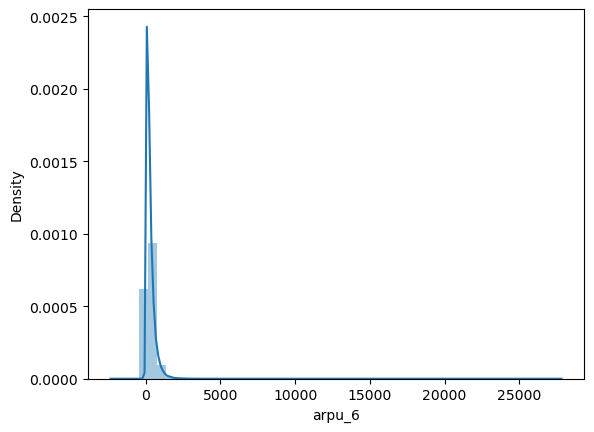

In [105]:
univariate(df.arpu_6)

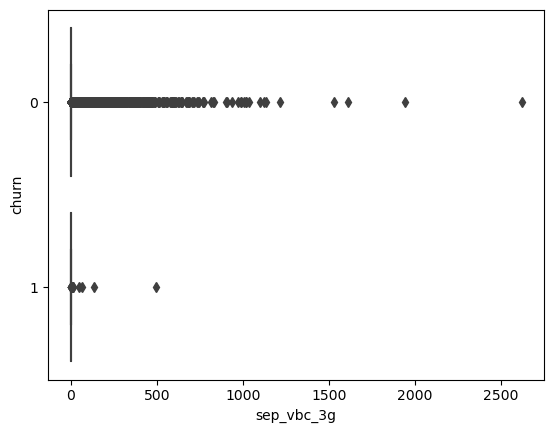

In [106]:
bivariate(high_value_customer.sep_vbc_3g, high_value_customer.churn)

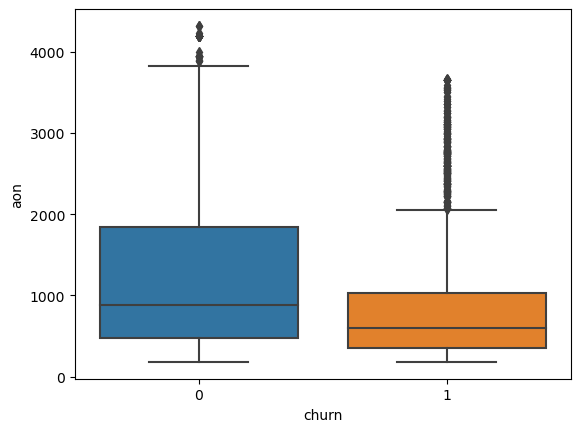

In [107]:
bivariate(high_value_customer.churn, high_value_customer.aon)

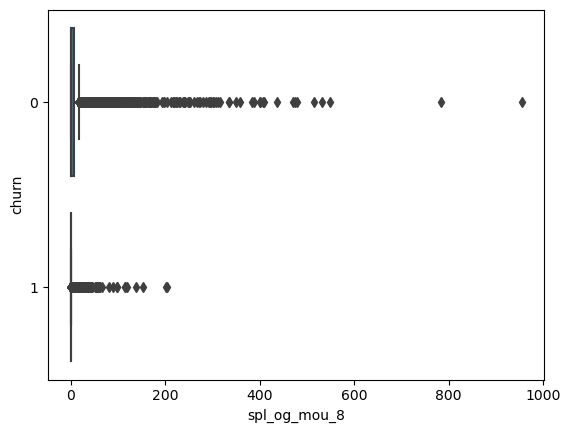

In [108]:
bivariate(high_value_customer.spl_og_mou_8, high_value_customer.churn)

count    99999.000000
mean     175.595457  
std      310.968398  
min      0.000000    
25%      16.030000   
50%      74.680000   
75%      202.830000  
max      10310.760000
Name: offnet_mou_9, dtype: float64


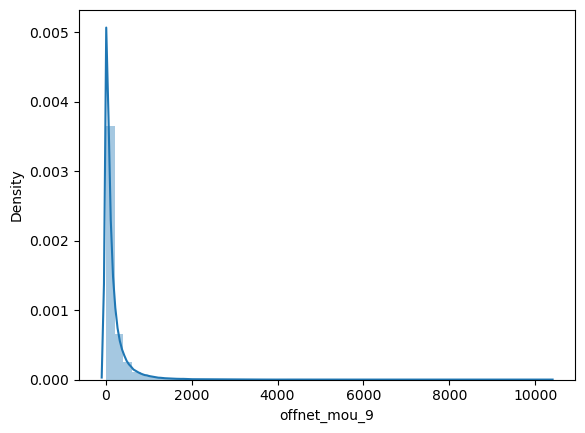

In [109]:
univariate(df.offnet_mou_9)

count    99999.000000
mean     125.864313  
std      302.023240  
min      0.000000    
25%      4.090000    
50%      28.040000   
75%      106.740000  
max      10752.560000
Name: onnet_mou_8, dtype: float64


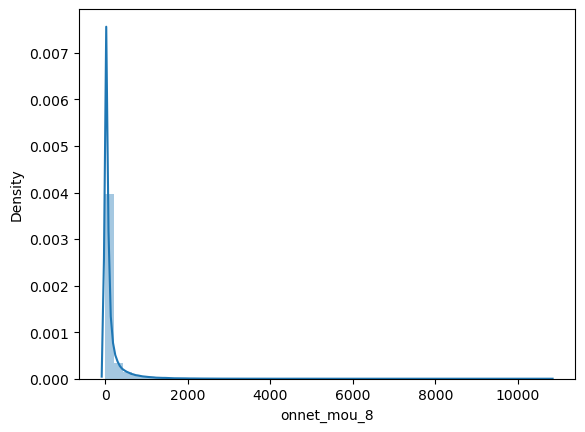

In [110]:
univariate(df.onnet_mou_8)

In [111]:
high_value_customer.columns

Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'arpu_6',
       'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8',
       ...
       'spl_ic_mou_diff', 'total_ic_mou_diff', 'total_rech_num_diff',
       'total_rech_amt_diff', 'max_rech_amt_diff', 'total_rech_data_diff',
       'max_rech_data_diff', 'av_rech_amt_data_diff', 'vol_2g_mb_diff',
       'vol_3g_mb_diff'],
      dtype='object', length=220)

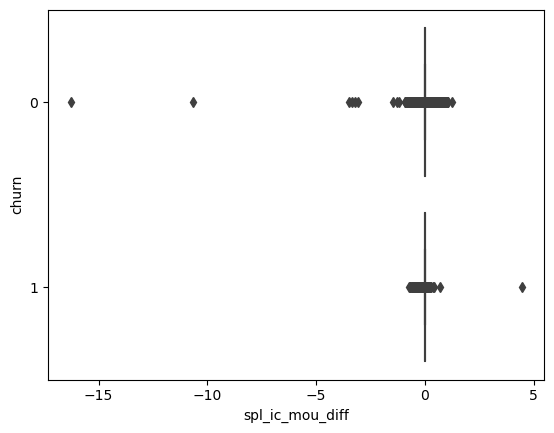

In [112]:
bivariate(high_value_customer.spl_ic_mou_diff, high_value_customer.churn)

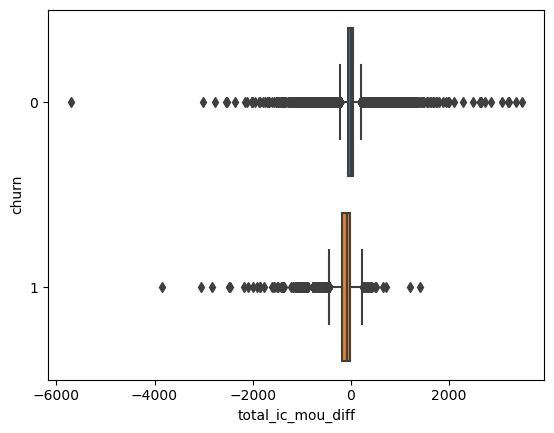

In [113]:
bivariate(high_value_customer.total_ic_mou_diff, high_value_customer.churn)

In [114]:
print('Summary metrics - Numeric Variables')

numeric_df = (high_value_customer.iloc[:,0:20])._get_numeric_data()
print(numeric_df.describe())

numeric_df = (high_value_customer.iloc[:,20:40])._get_numeric_data()
print(numeric_df.describe())
  
numeric_df = (high_value_customer.iloc[:,40:60])._get_numeric_data()
print(numeric_df.describe())

numeric_df = (high_value_customer.iloc[:,60:80])._get_numeric_data()
print(numeric_df.describe())

numeric_df = (high_value_customer.iloc[:,80:100])._get_numeric_data()
print(numeric_df.describe())

numeric_df = (high_value_customer.iloc[:,100:120])._get_numeric_data()
print(numeric_df.describe())

numeric_df = (high_value_customer.iloc[:,120:140])._get_numeric_data()
print(numeric_df.describe())

numeric_df = (high_value_customer.iloc[:,140:160])._get_numeric_data()
print(numeric_df.describe())

Summary metrics - Numeric Variables
       loc_og_t2o_mou  std_og_t2o_mou  loc_ic_t2o_mou        arpu_6  \
count  29953.0         29953.0         29953.0         29953.000000   
mean   0.0             0.0             0.0             558.820058     
std    0.0             0.0             0.0             460.868223     
min    0.0             0.0             0.0            -2258.709000    
25%    0.0             0.0             0.0             310.142000     
50%    0.0             0.0             0.0             482.354000     
75%    0.0             0.0             0.0             700.240000     
max    0.0             0.0             0.0             27731.088000   

             arpu_7        arpu_8        arpu_9   onnet_mou_6   onnet_mou_7  \
count  29953.000000  29953.000000  29953.000000  29953.000000  29953.000000   
mean   561.160547    508.890301    467.446183    260.900880    268.051744     
std    480.028497    502.136278    501.837624    459.853278    480.303238     
min   -2

## Summary of EDA:

**Calls Revenue (3 columns):**

- **Invalid Values:** These columns contain negative minimum values, indicating some customers may be causing losses to the company. Consider dropping these columns as they are either invalid or do not add value to our predictions.

- **Standardize:** Round the Revenue columns to 2 decimal places.

**Minutes of Usage (60+ columns):**

- **Usage Minutes:** Usage minutes are generally 0 except for a few outliers in the following variables: Roaming, Incoming ISD, Incoming Special, Incoming Others, STD Incoming, T2F STD Outgoing, T2F Outgoing, Others, ISD Outgoing, Local Outgoing, and T2C (Customer care calls).

- Most of these columns have outliers.

- Consider aggregating columns based on incoming and outgoing calls or aggregating based on each type of incoming and outgoing calls to gain a better understanding of the data.

**Recharge (12 Numeric + 3 Date columns):**

- **Data Type Conversion:** Convert numeric columns to integers.

- Convert date columns to date types.

**Data 2G and 3G (22 Columns):**

- Most columns have a median of 0 and contain outliers.

- Consider renaming the 'vbc_3g' columns to encode the month as its number.

- Standardize the columns by rounding them to 2 decimal places.

**Age on Network (1 Column):**

- Consider deriving features from the AON (Age on Network) column.

**Churn (Dependent Variable):**

- Note the existence of class imbalance in the dataset, where actual churn customers account for only 6% of the dataset.

**Reviewing the Dropped Columns:**

- Be mindful that more columns will be lost due to dropping missing value columns, which can potentially be imputed by considering 0 as missing values. This pattern seems to indicate that users who make calls have blanks for data-related columns, and vice versa.

**Feature Engineering - Thoughts:**

- Derive the number of years the customer has been using the network from the AON column.

- Create fields to indicate the type of user the customer is, such as users of both calls and data, only calls, only data, only incoming calls, only outgoing calls, etc.

- Segment customers based on service usage, recharge amount, and usage/recharge patterns.

- Calls to customer care can be a key indicator of customer dissatisfaction with the services; consider deriving columns like "time over call" in this context.

In [115]:
#Create a function to anlyze the features across 6th, 7th and 8th month:
def analyze_feature(feature_start):
    plt.rcParams["figure.figsize"] = [17, 7]
    fig = plt.figure()
    print("Churn Stats (mean and standard deviation):")
    cols = {c: feature_start + "_" + str(c) for c in [6,7,8]}
    print(cols)
    frame_data = []
    [frame_data.append({
        "mean_6": high_value_customer[high_value_customer["churn"] == churn][cols[6]].mean(),
        "mean_7": high_value_customer[high_value_customer["churn"] == churn][cols[7]].mean(),
        "mean_8": high_value_customer[high_value_customer["churn"] == churn][cols[8]].mean(),
        "std_6": high_value_customer[high_value_customer["churn"] == churn][cols[6]].std(),
        "std_7": high_value_customer[high_value_customer["churn"] == churn][cols[7]].std(),
        "std_8": high_value_customer[high_value_customer["churn"] == churn][cols[8]].std()
    }) for churn in [0,1]]
    
    f,axes = plt.subplots(nrows=1, ncols=3)
    sns.boxplot(data= high_value_customer, y = feature_start + "_6", x = "churn",
                hue = "churn", linewidth = 2.5, showfliers = False, ax = axes[0])
    sns.boxplot(data = high_value_customer, y = feature_start + "_7",  x = "churn",
                hue = "churn", linewidth = 2.5, showfliers = False, ax = axes[1])
    sns.boxplot(data= high_value_customer, y = feature_start + "_8",  x = "churn",
                hue = "churn", linewidth = 2.5, showfliers = False, ax = axes[2])
    return pd.DataFrame(frame_data, index = {"Non Churned","Churned"}).round(2)

Churn Stats (mean and standard deviation):
{6: 'total_rech_amt_6', 7: 'total_rech_amt_7', 8: 'total_rech_amt_8'}


,mean_6,mean_7,mean_8,std_6,std_7,std_8
Churned,649.97,663.89,613.98,547.95,574.45,615.04
Non Churned,787.33,627.46,253.69,682.48,668.66,452.97


<Figure size 1700x700 with 0 Axes>

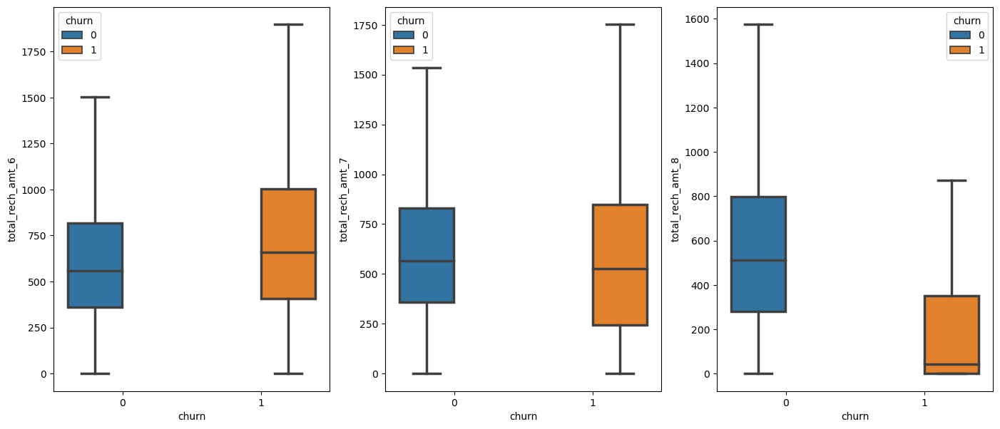

In [116]:
analyze_feature('total_rech_amt')

In [117]:
recharge_amont_columns = high_value_customer.columns[high_value_customer.columns.str.contains('rech_amt')]
recharge_amont_columns

Index(['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'total_rech_amt_9', 'max_rech_amt_6', 'max_rech_amt_7',
       'max_rech_amt_8', 'max_rech_amt_9', 'av_rech_amt_data_6',
       'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9',
       'total_rech_amt_diff', 'max_rech_amt_diff', 'av_rech_amt_data_diff'],
      dtype='object')

Churn Stats (mean and standard deviation):
{6: 'max_rech_amt_6', 7: 'max_rech_amt_7', 8: 'max_rech_amt_8'}


,mean_6,mean_7,mean_8,std_6,std_7,std_8
Churned,169.10,173.40,166.83,172.1,176.85,171.42
Non Churned,172.18,159.66,85.54,209.4,227.28,176.90


<Figure size 1700x700 with 0 Axes>

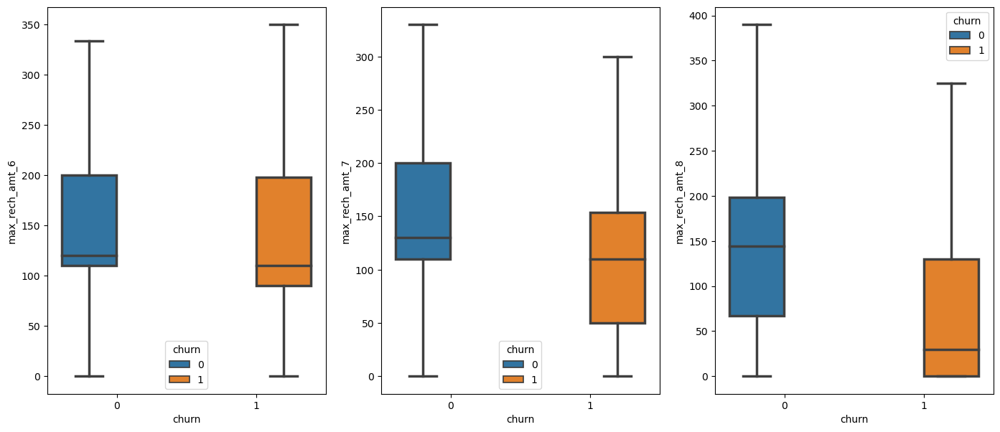

In [118]:
#Let's examine the cumulative data recharge amount:
analyze_feature('max_rech_amt')

In [119]:
pd.crosstab(high_value_customer.churn, high_value_customer.night_pck_user_8, normalize='columns')*100

night_pck_user_8,-1.0,0.0,1.0
churn,,,
0,85.918105,97.114275,97.360704
1,14.081895,2.885725,2.639296


In [120]:
pd.crosstab(high_value_customer.churn, high_value_customer.sachet_3g_8)

sachet_3g_8,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,23.0,25.0,27.0,29.0,30.0,38.0,41.0
churn,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,24936,1608,397,183,106,86,43,35,28,19,15,8,11,10,6,6,2,2,3,1,3,3,2,1,1,1,2,1,1
1,2361,48,5,8,4,2,1,0,2,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [121]:
def cap_outliers(array, k=3):
    upper_limit = array.mean() + k*array.std()
    lower_limit = array.mean() - k*array.std()
    array[array<lower_limit] = lower_limit
    array[array>upper_limit] = upper_limit
    return array

In [122]:
#Example of capping:
sample_array = list(range(100))

# add outliers to the data
sample_array[0] = -9999
sample_array[99] = 9999

#Cap outliers:
sample_array = np.array(sample_array)
print("Array after capping outliers: \n", cap_outliers(sample_array, k=2))

Array after capping outliers: 
 [-2780     1     2     3     4     5     6     7     8     9    10    11
    12    13    14    15    16    17    18    19    20    21    22    23
    24    25    26    27    28    29    30    31    32    33    34    35
    36    37    38    39    40    41    42    43    44    45    46    47
    48    49    50    51    52    53    54    55    56    57    58    59
    60    61    62    63    64    65    66    67    68    69    70    71
    72    73    74    75    76    77    78    79    80    81    82    83
    84    85    86    87    88    89    90    91    92    93    94    95
    96    97    98  2877]


In [123]:
#Apply a cap to outliers found within the numeric columns:
high_value_customer[num_columns] = high_value_customer[num_columns].apply(cap_outliers, axis=0)

In [124]:
high_value_customer.describe(percentiles=[0.01, 0.10,.25,.5,.75,.90,.95,.99])

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
count,29953.0,29953.0,29953.0,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.0,29953.0,29953.0,29953.0,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29

In [125]:
#Building the model:
#Numeric form:
high_value_customer['churn'] = pd.to_numeric(high_value_customer['churn'])

In [126]:
X = high_value_customer.drop("churn", axis = 1)
y = high_value_customer.churn
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 4, stratify = y)

In [127]:
train = pd.concat([X_train, y_train], axis=1)

#Aggregate the categorical variables:
train.groupby('night_pck_user_6').churn.mean()
train.groupby('night_pck_user_7').churn.mean()
train.groupby('night_pck_user_8').churn.mean()
train.groupby('fb_user_6').churn.mean()
train.groupby('fb_user_7').churn.mean()
train.groupby('fb_user_8').churn.mean()

fb_user_8
-1.0    0.141152
0.0     0.062857
1.0     0.025074
Name: churn, dtype: float64

In [128]:
y_test.shape

(7489,)

In [129]:
 y_train.shape

(22464,)

In [130]:
X_train.shape

(22464, 219)

In [131]:
X_test.shape

(7489, 219)

In [132]:
#Substitute categorical values with aggregated values:
mapping = {'night_pck_user_6' : {-1: 0.099165, 0: 0.066797, 1: 0.087838},
           'night_pck_user_7' : {-1: 0.115746, 0: 0.055494, 1: 0.051282},
           'night_pck_user_8' : {-1: 0.141108, 0: 0.029023, 1: 0.016194},
           'fb_user_6'        : {-1: 0.099165, 0: 0.069460, 1: 0.067124},
           'fb_user_7'        : {-1: 0.115746, 0: 0.059305, 1: 0.055082},
           'fb_user_8'        : {-1: 0.141108, 0: 0.066887, 1: 0.024463}
          }
X_train.replace(mapping, inplace = True)
X_test.replace(mapping, inplace = True)

In [134]:
#Datatypes:
X_train[[col for col in cat_columns if col not in ['churn']]].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22464 entries, 14197 to 17924
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   night_pck_user_6  22464 non-null  category
 1   night_pck_user_7  22464 non-null  category
 2   night_pck_user_8  22464 non-null  category
 3   fb_user_6         22464 non-null  category
 4   fb_user_7         22464 non-null  category
 5   fb_user_8         22464 non-null  category
dtypes: category(6)
memory usage: 307.9 KB


# PCA

In [135]:
(high_value_customer.isnull().sum()*100/high_value_customer.shape[0]).sort_values(ascending = False)

loc_og_t2o_mou           0.0
max_rech_data_6          0.0
max_rech_amt_7           0.0
max_rech_amt_8           0.0
max_rech_amt_9           0.0
last_day_rch_amt_6       0.0
last_day_rch_amt_7       0.0
last_day_rch_amt_8       0.0
last_day_rch_amt_9       0.0
total_rech_data_6        0.0
total_rech_data_7        0.0
total_rech_data_8        0.0
total_rech_data_9        0.0
max_rech_data_7          0.0
total_rech_amt_9         0.0
max_rech_data_8          0.0
max_rech_data_9          0.0
av_rech_amt_data_6       0.0
av_rech_amt_data_7       0.0
av_rech_amt_data_8       0.0
av_rech_amt_data_9       0.0
vol_2g_mb_6              0.0
vol_2g_mb_7              0.0
vol_2g_mb_8              0.0
vol_2g_mb_9              0.0
vol_3g_mb_6              0.0
max_rech_amt_6           0.0
total_rech_amt_8         0.0
std_og_t2o_mou           0.0
isd_ic_mou_6             0.0
std_ic_mou_7             0.0
std_ic_mou_8             0.0
std_ic_mou_9             0.0
total_ic_mou_6           0.0
total_ic_mou_7

In [136]:
#Performing PCA on the training data:
pca = Pipeline([('scaler', StandardScaler()), ('pca', PCA())])

In [137]:
pca.fit(X_train)
churn_pca = pca.fit_transform(X_train)

In [138]:
#Extracting the PCA model from pipeline:
pca = pca.named_steps['pca']

#Examine the explained variance of PCA components:
print(pd.Series(np.round(pca.explained_variance_ratio_.cumsum(), 4)*100))

0      11.51 
1      21.20 
2      27.00 
3      31.55 
4      35.25 
5      38.77 
6      41.42 
7      43.63 
8      45.74 
9      47.81 
10     49.78 
11     51.64 
12     53.32 
13     54.84 
14     56.33 
15     57.75 
16     59.07 
17     60.34 
18     61.50 
19     62.63 
20     63.73 
21     64.80 
22     65.79 
23     66.76 
24     67.68 
25     68.57 
26     69.43 
27     70.28 
28     71.12 
29     71.94 
30     72.73 
31     73.50 
32     74.25 
33     74.99 
34     75.70 
35     76.39 
36     77.05 
37     77.68 
38     78.31 
39     78.92 
40     79.50 
41     80.06 
42     80.56 
43     81.05 
44     81.53 
45     81.99 
46     82.44 
47     82.87 
48     83.30 
49     83.73 
50     84.14 
51     84.54 
52     84.92 
53     85.28 
54     85.64 
55     85.98 
56     86.31 
57     86.64 
58     86.96 
59     87.28 
60     87.58 
61     87.89 
62     88.18 
63     88.47 
64     88.76 
65     89.03 
66     89.31 
67     89.57 
68     89.84 
69     90.10 
70     90.35 
71    

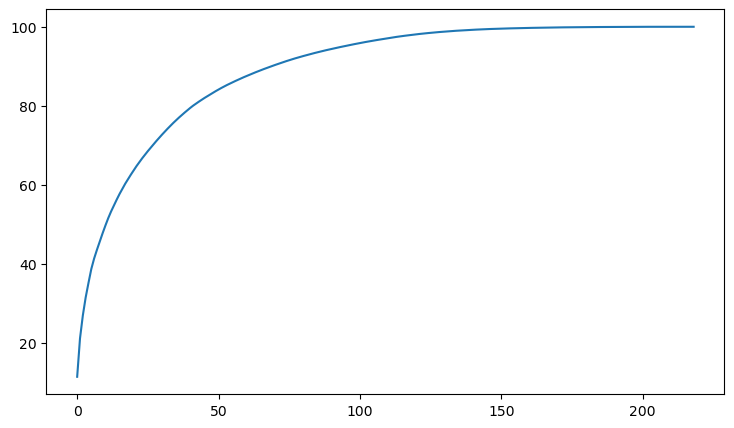

In [139]:
#Plotting feature variance:
features = range(pca.n_components_)
cumulative_variance = np.round(np.cumsum(pca.explained_variance_ratio_)*100, decimals = 4)
plt.figure(figsize=(175/20,100/20)) #Normalizing with a factor of 20, using a grid of 175 elements on the x-axis and 100 elements on the y-axis
plt.plot(cumulative_variance)

In [140]:
#Creating the pipeline:
PCA_VARS = 60
steps = [('scaler', StandardScaler()),("pca", PCA(n_components=PCA_VARS)),("logistic", LogisticRegression(class_weight='balanced'))]
pipeline = Pipeline(steps)

In [141]:
#Fitting the model:
pipeline.fit(X_train, y_train)

#Check score on the training data:
pipeline.score(X_train, y_train)

0.9594462250712251

In [143]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC

In [144]:
#Predicting churn on the test data:
y_pred = pipeline.predict(X_test)

#Creating confusion matrix:
print(confusion_matrix(y_test, y_pred))

#Checking sensitivity and specificity:
from imblearn.metrics import sensitivity_specificity_support

sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

#Checking area under curve
y_pred_prob = pipeline.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[6559  322]
 [   6  602]]
Sensitivity: 	0.99
Specificity: 	0.95
AUC:    	 0.99


# Hyperparameter Tuning

In [145]:
logistic = LogisticRegression(class_weight = {0:0.1, 1: 0.9})

In [146]:
steps = [("scaler", StandardScaler()),("pca", PCA()),("logistic", logistic)]

In [147]:
pca_logistic = Pipeline(steps)

In [148]:
param = {'pca__n_components': [60, 80], 'logistic__C': [0.1, 0.4, 0.5], 'logistic__penalty': ['l1', 'l2']}

In [149]:
#5Folds:
fold = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 20)

In [150]:
#Model:
model = GridSearchCV(estimator = pca_logistic, cv = fold, param_grid = param, scoring='roc_auc', n_jobs=-1, verbose=1)

In [151]:
#Fit the model:
model.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=20, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA()),
                                       ('logistic',
                                        LogisticRegression(class_weight={0: 0.1,
                                                                         1: 0.9}))]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.1, 0.4, 0.5],
                         'logistic__penalty': ['l1', 'l2'],
                         'pca__n_components': [60, 80]},
             scoring='roc_auc', verbose=1)

In [152]:
#Cross validation:
pd.DataFrame(model.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_logistic__C,param_logistic__penalty,param_pca__n_components,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1.852305,0.038922,0.000000,0.000000,0.1,l1,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l1', 'pca__n_components': 60}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,7
1,2.052100,0.028637,0.000000,0.000000,0.1,l1,80,"{'logistic__C': 0.1, 'logistic__penalty': 'l1', 'pca__n_components': 80}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,8
2,2.504479,0.194400,0.320206,0.276038,0.1,l2,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l2', 'pca__n_components': 60}",0.994074,0.989560,0.990077,0.990832,0.991805,0.991270,0.001593,6
3,5.220144,0.988096,0.425284,0.126040,0.1,l2,80,"{'logistic__C': 0.1, 'logistic__penalty': 'l2', 'pca__n_components': 80}",0.995336,0.992565,0.992263,0.992490,0.992756,0.993082,0.001138,3
4,3.344397,1.893552,0.000000,0.000000,0.4,l1,60,"{'logistic__C': 0.4, 'logistic__penalty': 'l1', 'pca__n_components': 60}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
5,10.047986,1.887866,0.000000,0.000000,0.4,l1,80,"{'logistic__C': 0.4, 'logistic__penalty': 'l1', 'pca__n_components': 80}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,10
6,10.850874,0.765773,0.424442,0.239543,0.4,l2,60,"{'logistic__C': 0.4, 'logistic__penalty': 'l2', 'pca__n_components': 60}",0.994416,0.990206,0.990267,0.990907,0.991546,0.991469,0.001552,5
7,14.226855,0.762327,0.223744,0.113220,0.4,l2,80,"{'logistic__C': 0.4, 'logistic__penalty': 'l2', 'pca__n_components': 80}",0.995926,0.993719,0.993321,0.993505,0.992301,0.993754,0.001190,2
8,8.747569,0.510016,0.000000,0.000000,0.5,l1,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l1', 'pca__n_components': 60}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,11
9,10.192395,0.177927,0.000000,0.000000,0.5,l1,80,"{'logistic__C': 0.5, 'logistic__penalty': 'l1', 'pca__n_components': 80}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,12


In [153]:
#Best hyperparameters score:
model.best_score_

0.994066390244751

In [154]:
#Best hyperparameters:
model.best_params_

{'logistic__C': 0.5, 'logistic__penalty': 'l2', 'pca__n_components': 80}

In [155]:
#Predicting churn on the test data:
y_pred = model.predict(X_test)

#Creating confusion matrix:
print(confusion_matrix(y_test, y_pred))

#Checking sensitivity and specificity:
from imblearn.metrics import sensitivity_specificity_support

sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

#Check the area under curve:
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),3))

[[6604  277]
 [   3  605]]
Sensitivity: 	1.0
Specificity: 	0.96
AUC:    	 0.994


### Using random forest

In [156]:
frt = RandomForestClassifier(class_weight = {0:0.1, 1: 0.9}, n_jobs = -1)

In [157]:
param = {"criterion": ['gini', 'entropy'], "max_features": [1]}

In [158]:
#Creating folds:
fold = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 20)

In [159]:
#Grid search:
model = GridSearchCV(estimator=frt, cv=fold, param_grid=param, scoring='roc_auc', n_jobs=-1, verbose=1)

In [160]:
#Fit the model:
model.fit(X_train, y_train)

Fitting 5 folds for each of 2 candidates, totalling 10 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=20, shuffle=True),
             estimator=RandomForestClassifier(class_weight={0: 0.1, 1: 0.9},
                                              n_jobs=-1),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'], 'max_features': [1]},
             scoring='roc_auc', verbose=1)

In [161]:
#Best hyperparameters score:
model.best_score_

0.9993719121615994

In [162]:
#Best hyperparameters:
model.best_params_

{'criterion': 'entropy', 'max_features': 1}

In [163]:
#Predicting churn on test data:
y_pred = model.predict(X_test)

#Creating confusion matrix:
print(confusion_matrix(y_test, y_pred))

#Checking sensitivity and specificity:
from imblearn.metrics import sensitivity_specificity_support

sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

#Check the area under curve:
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[6872    9]
 [  36  572]]
Sensitivity: 	0.94
Specificity: 	1.0
AUC:    	 1.0


**It appears that the random forest model is exhibiting signs of overfitting, and its sensitivity is notably low. As a result, we are opting for a logistic regression model combined with Principal Component Analysis (PCA) as a more suitable approach.**

In [164]:
#Run a Random Forest model on the training data:
max_features = int(round(np.sqrt(X_train.shape[1])))
rand_frt_model = RandomForestClassifier(n_estimators = 100, max_features = max_features, class_weight = {0:0.1, 1: 0.9}, oob_score=True, random_state=20, verbose=1)

In [165]:
#Fit the model:
rand_frt_model.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    3.0s


RandomForestClassifier(class_weight={0: 0.1, 1: 0.9}, max_features=15,
                       oob_score=True, random_state=20, verbose=1)

In [166]:
#Check the OOB score:
rand_frt_model.oob_score_

0.9996438746438746

In [167]:
#Predicting churn on test data:
y_pred = rand_frt_model.predict(X_test)

#Creating confusion matrix:
print(confusion_matrix(y_test, y_pred))

#Checking sensitivity and specificity:
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

#Check the area under curve:
y_pred_prob = rand_frt_model.predict_proba(X_test)[:, 1]
print("ROC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[6881    0]
 [   0  608]]
Sensitivity: 	1.0
Specificity: 	1.0
ROC:    	 1.0


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s


In [168]:
#Predictors:
feature = high_value_customer.drop('churn', axis=1).columns

In [169]:
#feature importance:
importance = rand_frt_model.feature_importances_

In [170]:
#Create the dataframe:
feature_importance = pd.DataFrame({'variables': feature, 'importance_percentage': importance*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

In [172]:
#Sort the features:
feature_importance= feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
print("Sum of importance=", feature_importance.importance_percentage.sum())
feature_importance

Sum of importance= 100.0


,variables,importance_percentage
0,total_ic_mou_9,8.643721e+00
1,loc_ic_t2m_mou_9,8.636399e+00
2,loc_ic_mou_9,7.839673e+00
3,loc_og_mou_9,7.476869e+00
4,loc_og_t2t_mou_9,6.486731e+00
5,loc_ic_t2t_mou_9,5.402265e+00
6,loc_og_t2m_mou_9,4.667902e+00
7,arpu_9,4.616008e+00
8,max_rech_amt_9,4.454783e+00
9,total_og_mou_9,3.632282e+00


In [174]:
#Extracting the top 'n' features:
top_features = feature_importance.variables[0:50]

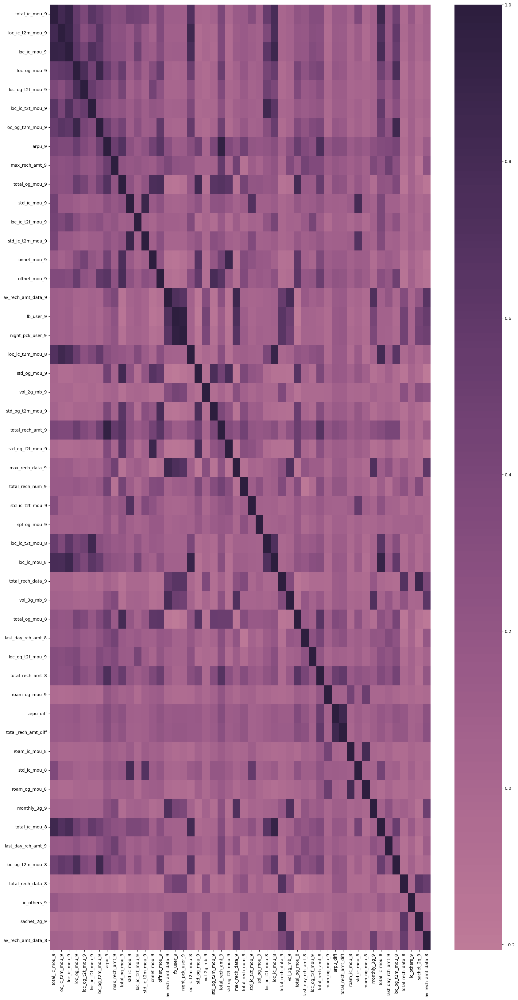

In [175]:
#Plot the feature correlation:
plt.figure(figsize = (20,40))
mycmap = sns.diverging_palette(199, 359, s = 99, center = "light", as_cmap = True)
sns.heatmap(data = X_train[top_features].corr(), center=0.0, cmap = sns.cubehelix_palette(200))
plt.show()

In [176]:
#Choose pertinent features:
top_features = ['total_ic_mou_8', 'total_rech_amt_diff', 'total_og_mou_8', 'arpu_8', 'roam_ic_mou_8', 'roam_og_mou_8', 'std_ic_mou_8', 'av_rech_amt_data_8', 'std_og_mou_8']
X_train = X_train[top_features]
X_test = X_test[top_features]

In [177]:
#Logistic regression:
step = [('scaler', StandardScaler()),("logistic", LogisticRegression(class_weight={0:0.1, 1:0.9}))]

#Compiling:
logistic = Pipeline(step)

#Hyperparameter:
param = {'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']}

#5folds:
fold = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

#Creating the gridsearch:
model = GridSearchCV(estimator = logistic, cv = fold, param_grid = param, scoring = 'roc_auc', n_jobs = -1, verbose = 1)

In [178]:
#Fit the model:
model.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('logistic',
                                        LogisticRegression(class_weight={0: 0.1,
                                                                         1: 0.9}))]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10],
                         'logistic__penalty': ['l1', 'l2']},
             scoring='roc_auc', verbose=1)

In [179]:
#Best hyperparameters score:
model.best_score_

0.8737283038701744

In [180]:
#Best hyperparameters:
model.best_params_

{'logistic__C': 10, 'logistic__penalty': 'l2'}

In [181]:
#Predicting churn on the test data:
y_pred = model.predict(X_test)

#Create the confusion matrix:
print(confusion_matrix(y_test, y_pred))

#Checking sensitivity and specificity:
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

#Check the area under curve:
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("ROC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[5795 1086]
 [ 120  488]]
Sensitivity: 	0.8
Specificity: 	0.84
ROC:    	 0.88


In [182]:
logistic_model = model.best_estimator_.named_steps['logistic']

In [183]:
#Intercept:
intercept_df = pd.DataFrame(logistic_model.intercept_.reshape((1,1)), columns = ['intercept'])

In [184]:
#Coefficients:
coefficient = logistic_model.coef_.reshape((9, 1)).tolist()
coefficient = [val for sublist in coefficient for val in sublist]
coefficient = [round(coefficient, 3) for coefficient in coefficient]
logistic_feature = list(X_train.columns)
coefficients_df = pd.DataFrame(logistic_model.coef_, columns = logistic_feature)

In [185]:
#Concatenate the dataframes:
coefficients = pd.concat([intercept_df, coefficients_df], axis=1)
coefficients

,intercept,total_ic_mou_8,total_rech_amt_diff,total_og_mou_8,arpu_8,roam_ic_mou_8,roam_og_mou_8,std_ic_mou_8,av_rech_amt_data_8,std_og_mou_8
0,-1.51938,-1.149391,-0.70291,-1.52744,0.236451,-0.020204,0.212363,0.062618,-0.791111,0.941812


### Primary churn indicator

The significant factors influencing churn include the following variables for the action phase (month 8): total_ic_mou_8 (Total incoming call minutes of usage), total_rech_amt_diff (Difference in total recharge amount), total_og_mou_8 (Total outgoing call minutes of usage), arpu (Average revenue per user), roam_ic_mou_8 (Roaming incoming call minutes of usage), roam_og_mou_8 (Roaming outgoing call minutes of usage), std_ic_mou_8 (STD incoming call minutes of usage), std_og_mou_8 (STD outgoing call minutes of usage), and av_rech_amt_data_8 (Average recharge amount in the action phase).

### Strategies for Mitigating Churn

- Offer personalized discounts based on customer usage.

- Provide extra internet services upon recharge.

- Engage with customers to meet their specific needs.

- Reduce data tariffs and improve 2G coverage in areas without 3G.

- Expand the 3G network to areas currently lacking 3G coverage.